# Image Recognition using PCA

## 0. Table of Contents

## 1. Business Understanding

### 1.1 Data Set Overview
Image recognition has evolved a lot in recent years thanks to the develoment in Machine Learning and Deep Learning realm. It is also fostered by the availablility of mass images resources online due to the rise of social media where people sharing everything online, thus providing a great big data resource for researchers and corporate alike to dig into it.

Among other websites, ImageNet is a very good place to start for researchers looking for data set to train their algorithm. It has over 14 million images URLs that has been categorized and labeled into 'synset' (synonym set). Each synset holds more than 1000 images that are quality controlled and human-annotated. Perfect to be used in deep learning training set and also a good fit for this project.

However, ImageNet doesn't host the images on it server that researchers can directly download. Instead, they provide URLs for the images that user can download, and then use these URLs to download the images themselves. So we manually downloaded the images using some Python codes, reading from the URLs and pass it into Python for downloading. Once they are downloaded, we manually pick out the bad quality ones(ones with multiple irrelevant subjects and/or noise), and leave 200 images for each synset.

The synset we downloaded are all flowers. There are totally five of them:
Rose, Tulip, Peony, Hydrangea and Blue Bonnet. 
Each synset has 200 images. For each image, we desaturated it and resized it into 120x120 size for ease of processing.

For this project, the goal is to create an effective flower idenfitication algorithm that can recognize a flower from a photo. Learning from a dataset that already has flower name labeled, the algorithm should be able to reach a high recognition rate for different flowers.

### 1.2 Value Proposition
Flowers recognition has a lot of applications. Some of them have great research, environmental or even business values. 
There are more and more flower species that [become endangered](http://www.telegraph.co.uk/news/uknews/crime/10569640/Worlds-smallest-water-lily-stolen-from-Kew-Gardens.html) during the past 10 years. To slow down or even reverse the process, developing efficient way using machine learning has great value. The foundation of all endangered flowers protection is first to recognize one when see it. This is much harder to do than people usually think. Knowledge of which flower become endangered are limited to certain group of scientists and they have limited access to where these flowers grow. People local to the flowers usually doesn't have the ability to recognize an endangered flowers when see one. This is where flower identification algorithm can help. A programme of endangered flowers proction can be developed so that the programme will fund the equipment of GoPro helm for local people that go into forest often. Equiped with the flower identification algorithm, it's possible  to observe the nature while local people wonder around, and if any endangered flowers are identified. It can be recorded and further dealt with properly. Even if the algorithm's success rate is not very precise, with around 80% acurracy will help greatly to single out cases for human experts to further check. 
Certain flowers has great medicine value. A good quality wild genseng could sell for a good fortune. 
![Genseng Flowers 1](https://png.pngtree.com/element_origin_min_pic/16/08/25/1357be8906de98b.jpg)

There are professionals that go into the forest and search for these flowers and dig the root to sell or get the seed so they can grow more in the future. The problem some rare herbs grow in very dangerous places. It is risky to survey an area for the plant without knowing whether they are there at all. 
Being able to identify flowers make the work more efficient. A drone can be setup to fly through certain programable route and capture videos while they fly past the area. These videos can then be checked using the flower identification algorithm to see if a positive found is present. This risk free survey of potential rare herbs can greatly increase the success rate of gathering these herbs and decrease risk at the same time.

### 1.3 Evaluation Criteria
For our flower identification algorithm, a success rate of 80% is what we are shooting for. There are two main challenges for getting the perfect identification:
First challenge is environment noise. Flowers grow in forrest and gardens mostly which means it will be really hard to tell foreground from background. Identifying a cactus flower in a desert might be easier, but most of the other flowers grows in much more complex environment. How to reduce the environmental noise is the first challenge. 
The second challenge will be the size of flowers. Photos and/or videos taken by getting very close to flowers are rare to come by. This algorithm will be facing photos and videos taken from a distance(like with a drone flying by and take survey video's case), and flowers will look quite small in the screen. This increase the difficulty in anlyzing the flower features since the effective resolution for the algorithm is quite low, thus more prone to mis-classifications. 
From former research, the usual flower identification success rate is around 80%. So it's proper and reasonable for us to set the success goal at **80%** success rate of our flower identification algorithm. 

## 2. Data Preparation
The dataset from ImageNet requires some efforts to get in order so it can be suitable for our purpose. We used some Python code to read in the URLs of images downloaded from ImageNet and then download these images to local hard drive. For each flower cateogry, there are around 1000 images, we only need 200 of them.  We used the following criteria to rule out 'bad' quality photos:
1. Signal/Noise Ratio: If the flower is too small on the photo, basically occupying less than 50% of the canvas, we'll mark it as 'bad' and not use it. (one exception is for our 'Blue Bonnet' category where we can't find many close shots)
2. Photos with other objects like people, kids, dogs, buldings. 
3. Photos with big frames (some of these photos can still be used after some image processing. Since we have limited time for the project and we have plenty of 'good' photos to use, we will just mark these as 'bad' this time)
4. Simple corrupted image files.

After filtered out the unqualified photos, we get our dataset of 1000 photos, with five categories, each 200 photos. 
For these photos, we resize them all to 120x120 and make them all gray-scale for further processing. 

### 2.1 Image Download and Importing

#### 2.1.1 Image Downloading
*add image downloading code here

#### 2.1.2 Image Importing

In [91]:
# import necessary modules
import os
import matplotlib.pyplot as plt
from skimage.io import imread, imsave, imshow
from skimage.color import rgb2grey as r2g
from skimage.transform import resize as resize

import warnings
warnings.filterwarnings('ignore')

In [92]:
import os
import numpy as np

The photos are stored under 'Dataset' folder and within it five subfolders: Rose, Peony, Tulip, Hydrangea and Blue Bonnet. We uses Python's os module to read in all the image filenames within each subfolder. 

In [93]:
# List all classes' images
rose = os.listdir('Dataset/Rose/')
peony = os.listdir('Dataset/Peony/')
tulip = os.listdir('Dataset/Tulip/')
hydrangea = os.listdir('Dataset/Hydrangea')
blue_bonnet = os.listdir('Dataset/Blue Bonnet/')

# check all the filenames have been properly read in
print(len(rose), len(peony), len(tulip), len(hydrangea), len(blue_bonnet))
rose[0:10]


200 200 200 200 200


['1414360050_d23d620390.jpg',
 '3498203312_d84db60b55.jpg',
 '536380252_bca8265079.jpg',
 '3936282559_fb8f14f588.jpg',
 '3937259104_edd1dc8598.jpg',
 '2393952017_9756e6f0ac.jpg',
 '2377073044_15c00557ca.jpg',
 '92758666_5c47ce8eb6.jpg',
 '2304146877_3489237f87.jpg',
 '2424345893_187a040df7.jpg']

### 2.2 Image Pre-processing

#### 2.2.1 Image Desaturation and Resizing 
Once we have all the image filename, we read in each image using Skimage module and do the resizing and gray-scale transform, then make them into an 1-D vector and append them into the dataset. 

In [94]:
data = []    # array holding all the images
target = [] # array holding all the categories 

# for each category, read in the image and do resizing, gray-scale and flatenning
for i in rose:
    img = imread('Dataset/Rose/'+i)
    img_grey = r2g(img)
    img_resize = resize(img_grey, (120, 120))
    imgX = img_resize.ravel()
    data.append(imgX)
    target.append('Rose')
    
    
for i in peony:
    img = imread('Dataset/Peony/'+i)
    img_grey = r2g(img)
    img_resize = resize(img_grey, (120, 120))
    imgX = img_resize.ravel()
    data.append(imgX)
    target.append('Peony')    

for i in tulip:
    img = imread('Dataset/Tulip/'+i)
    img_grey = r2g(img)
    img_resize = resize(img_grey, (120, 120))
    imgX = img_resize.ravel()
    data.append(imgX)
    target.append('Tulip')
    
for i in hydrangea:
    img = imread('Dataset/Hydrangea/'+i)
    img_grey = r2g(img)
    img_resize = resize(img_grey, (120, 120))
    imgX = img_resize.ravel()
    data.append(imgX)
    target.append('Hydrangea')
    
for i in blue_bonnet:
    img = imread('Dataset/Blue Bonnet/'+i)
    img_grey = r2g(img)
    img_resize = resize(img_grey, (120, 120))
    imgX = img_resize.ravel()
    data.append(imgX)
    target.append('Blue Bonnet')
    
data = np.asarray(data)
target = np.asarray(target)

# check the shape of the data to verify everything is in good shape
print(data.shape)
print(target.shape)

(1000, 14400)
(1000,)


### 2.3 Image Visualization

#### 2.3.1 Roses
Now that all the images have been read into the 'data' object, we can visualize it and see what we have. 

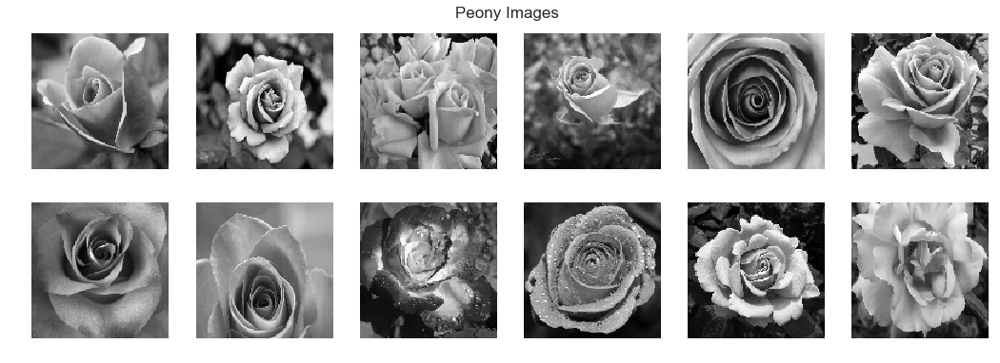

In [95]:
# Plot sample images function 
def plot_img(data, title='', imsize=120, n_row=2, n_col=6, figsize=(18,6),wspace=None,hspace=None):
    plt.figure(figsize=figsize)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(data[i].reshape(imsize,imsize),cmap = "gray")
        plt.axis('off')
    plt.suptitle(title,x=0.51,y=0.94,fontsize=17)
    plt.subplots_adjust(wspace=wspace,hspace=hspace)
    plt.show()

# Plot rose images
plot_img(data[target=='Rose'],title='Peony Images')

#### 2.3.2 Peony

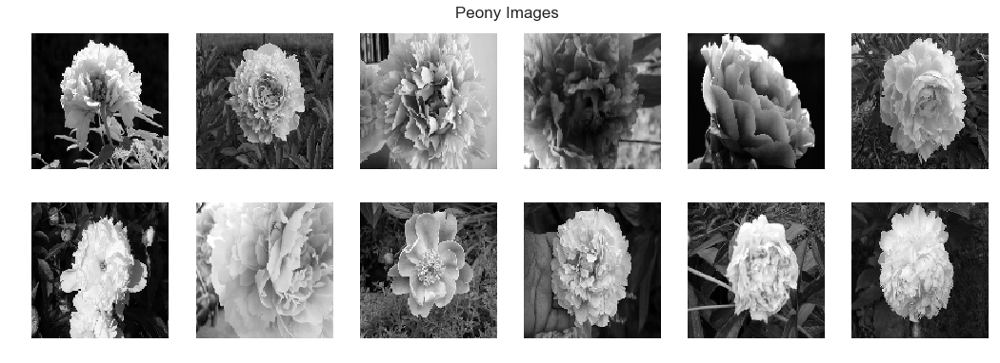

In [96]:
# Plot Peony images
plot_img(data[target=='Peony'],title='Peony Images')

#### 2.3.3 Tulip

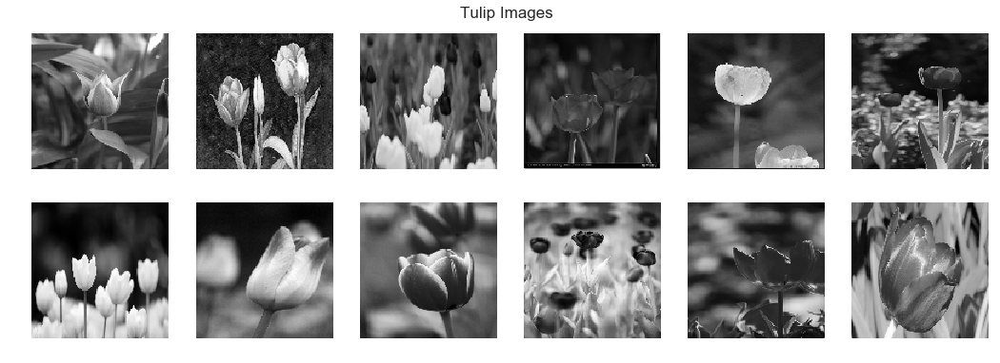

In [97]:
# Plot Tulip images
plot_img(data[target=='Tulip'],title='Tulip Images')

#### 2.3.4 Hydrangea

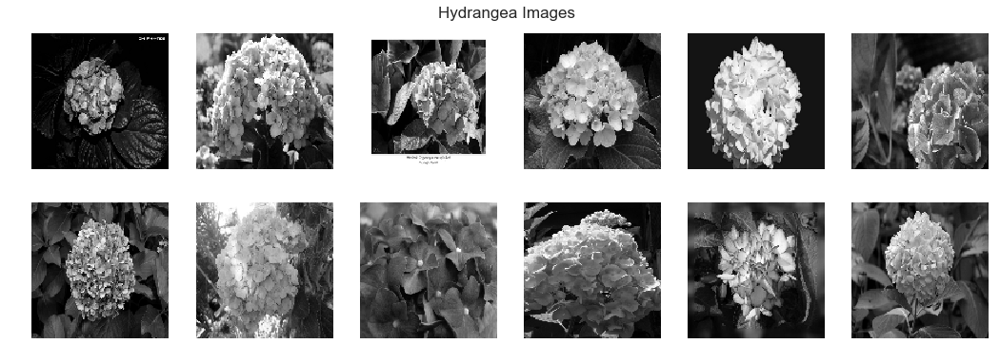

In [98]:
# Plot Hydrangea images
plot_img(data[target=='Hydrangea'],title='Hydrangea Images')

#### 2.3.5 Blue Bonnet

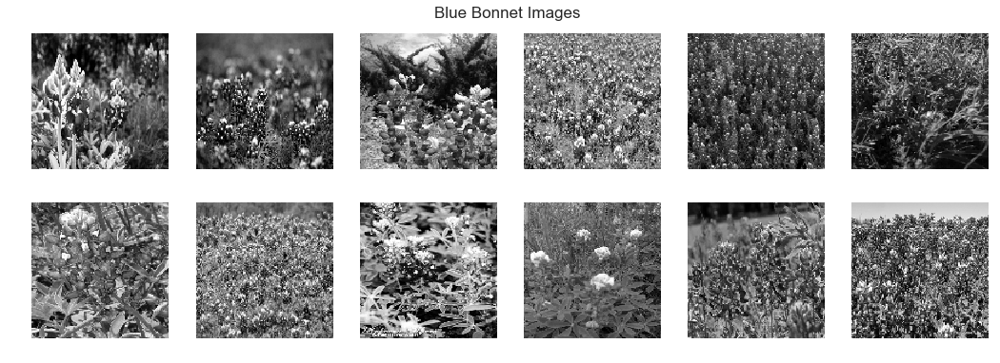

In [99]:
# Plot Blue Bonnet images
plot_img(data[target=='Blue Bonnet'],title='Blue Bonnet Images')

## 3. Data Reduction

### 3.1 Linear Dimentionality Reduction (PCA)
*pick one typical image, then apply PCA on it, analyze explained variance ratio and get the eigen images and visualize them. 
*compare the reconstructed image using PCA with original image, see if there's a difference. 

In [100]:
# get some of the specifics of the dataset
X = data
y = target
names = ['Rose','Blue Bonnet','Hydrangea','Tulip','Peony']
namesarray = np.asarray(names)
print(namesarray)
n_samples, n_features = X.shape

n_classes = len(names)
h = 120
w = 120
print(np.sum(~np.isfinite(X)))
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))
print (h*w) # the size of the images are the size of the feature vectors


['Rose' 'Blue Bonnet' 'Hydrangea' 'Tulip' 'Peony']
0
n_samples: 1000
n_features: 14400
n_classes: 5
Original Image Sizes 120 by 120
14400


In [101]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Scatter, Marker, Layout, XAxis, YAxis, Bar, Line
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })

In [64]:
# lets do some PCA of the features and go from 1850 features to 20 features
from sklearn.decomposition import PCA

n_components = 600
print ("Extracting the top %d eigenflowers from %d flowers" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenflowers = pca.components_.reshape((n_components, h, w))

plot_explained_variance(pca)
plt.show()

Extracting the top 600 eigenflowers from 1000 flowers
CPU times: user 11.7 s, sys: 496 ms, total: 12.2 s
Wall time: 4.77 s


In [102]:
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

Extracting the top 600 eigenflowers from 1000 flowers
CPU times: user 11.6 s, sys: 372 ms, total: 12 s
Wall time: 4.77 s


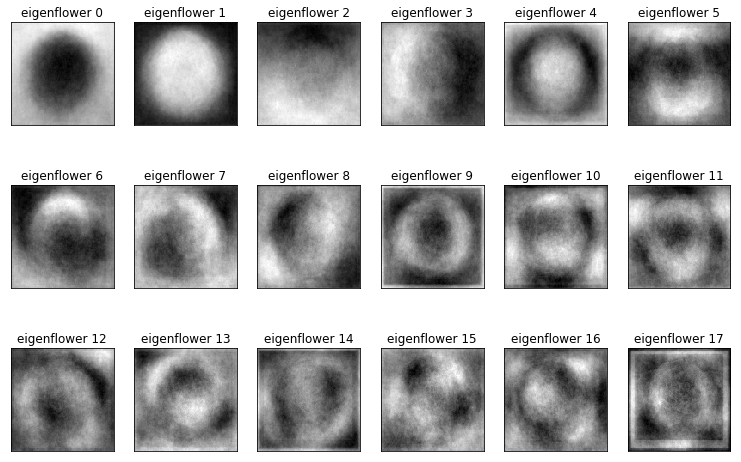

In [66]:
n_components = 600
print ("Extracting the top %d eigenflowers from %d flowers" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenflowers = pca.components_.reshape((n_components, h, w))

plot_explained_variance(pca)

eigenflower_titles = ["eigenflower %d" % i for i in range(eigenflowers.shape[0])]
plot_gallery(eigenflowers, eigenflower_titles, h, w)
plt.show()

def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image

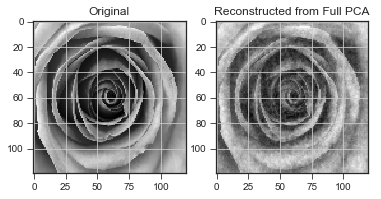

In [103]:
idx_to_reconstruct = 4    
X_idx = X[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))

plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid()
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid()
plt.show()

####  With the image size of 120*120, we had 14,400 features for an image . For linear dimentionality reduction we randomly chose 300 features for applying PCA, but the experience variance for the principle components was calculating to ~64% which was quite low. Hence we gradually increased the number of components upto 600 where we could achieve ~97% explained variance which seems a good result to represent an image using PCA.

### 3.2 Non-Linear Dimensionality Reduction (Kernal PCA)
*do the same thing as PCA, just using KPCA instead

In [104]:
%%time
from sklearn.decomposition import KernelPCA

n_components = 600
print ("Extracting the top %d eigenflowers from %d flowers, not calculating inverse transform" % (n_components, data.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=False, gamma=12, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X.copy())

Extracting the top 600 eigenflowers from 1000 flowers, not calculating inverse transform
CPU times: user 956 ms, sys: 132 ms, total: 1.09 s
Wall time: 563 ms


In [105]:
%%time
#  THIS  TAKES A LONG TIME TO RUN
from sklearn.decomposition import KernelPCA

n_components = 600
print ("Extracting the top %d eigenflowers from %d flowers, ALSO getting inverse transform" % (n_components, data.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=12, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X.copy())

Extracting the top 600 eigenflowers from 1000 flowers, ALSO getting inverse transform
CPU times: user 2min 3s, sys: 589 ms, total: 2min 3s
Wall time: 1min 2s


In [106]:
# the above operation takes a long time to save the inverse transform parameters
# so let's save out the results to load in later!
import pickle

pickle.dump(kpca, open( 'kpca.p', 'wb' ))

In [107]:
#Loading KPCA
import pickle
kpca = pickle.load(open( 'kpca.p', 'rb' ))

In [108]:
import warnings
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)

from ipywidgets import widgets

def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(data[idx_to_reconstruct].reshape(1, -1)))
    #reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(data[idx_to_reconstruct].reshape(1, -1)))
    
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,4,1)
    plt.imshow(data[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    plt.title(target[idx_to_reconstruct])
    plt.grid()
    
    plt.subplot(1,4,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    plt.grid()
    
    plt.subplot(1,4,3)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    plt.grid()

    plt.show()
    
    ## Calculating Mean Squared error
    MSE = ((data-reconstructed_image)**2).mean(axis=None)
    print('Mean Square Error PCA:',MSE)

    MSE_kernel = ((data-reconstructed_image_kpca)**2).mean(axis=None)
    print('Mean Square Error KPCA:',MSE_kernel)
    

widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,X.shape[0]-1,1),__manual=True)

A Jupyter Widget

<function __main__.plt_reconstruct>

### 
With visual representation, the KPCA images always displays better accuracy than PCA for our image dataset. But we also calculated Mean Square Error(MSE) for both Full PCA and Kernel PCA where we observed that in some cases MSE value for Kernel PCA exceed MSE value of PCA, but still the Kernel PCA image appeared more accurate and better compared to PCA in those cases. But by analysing and observing results for all images, MSE value for KPCA is majority of times lesser compared to PCA which leads us to conclusion that KPCA is a better way for representing images in reconstucted form compared to PCA as it provides us with more accurate reconstructed images from the original images.

### 3.3 Feature Extraction

#### 3.3.1 Edge Detection
edge detection etc.

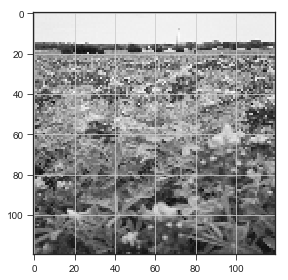

In [109]:
from skimage.io import imshow

idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))

imshow(img)

plt.grid()
plt.show()

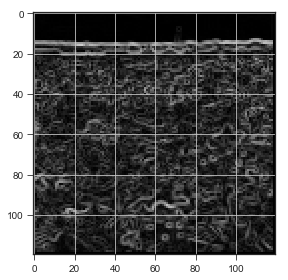

In [110]:
from skimage.filters import sobel_h, sobel_v

gradient_mag = np.sqrt(sobel_v(img)**2 + sobel_h(img)**2 ) 
imshow(gradient_mag)
plt.grid()
plt.show()

#### 3.3.2 Daisy Operator
Find out close photos

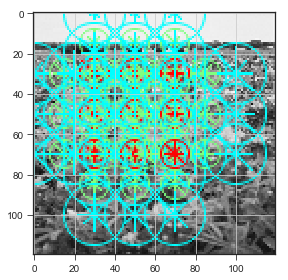

In [111]:
from skimage.feature import daisy

# lets first visualize what the daisy descripto looks like
features, img_desc = daisy(img,step=20, radius=30, rings=2, histograms=4, orientations=8, visualize=True)
imshow(img_desc)
plt.grid()
plt.show()

In [112]:
# create a function to take in the row of the matric and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=20, radius=30, rings=2, histograms=4, orientations=8, visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: user 36.7 ms, sys: 1.66 ms, total: 38.4 ms
Wall time: 37.3 ms


(648,)

In [113]:
0.027 * len(X)

27.0

In [114]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: user 34.9 s, sys: 235 ms, total: 35.1 s
Wall time: 35.5 s
(1000, 648)


In [115]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

CPU times: user 41.4 ms, sys: 4.86 ms, total: 46.2 ms
Wall time: 26.5 ms


We can look at the heatmap of the pairwise distances of extracted features. Images is ordered from 1 to 1000, with 200 photos a group: Rose, Peony, Tulip, Hydrangea, Blue Bonnet. If the flowers' features are different from each other enough, we should could see some grid pattern in the graph.

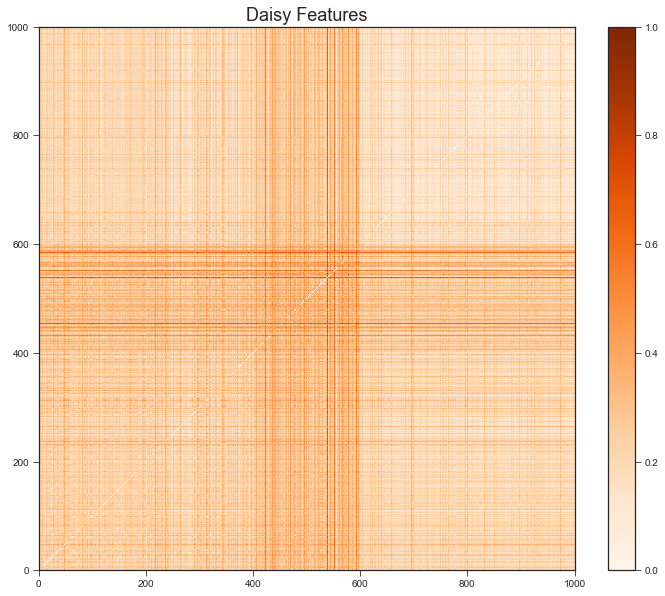

In [116]:
dist_matrix_norm = dist_matrix/dist_matrix.max()
# Plot heat map
import seaborn as sns

# sns.set_palette(['#1f77b4','#EB89B5'])
sns.set_style('ticks')
plt.figure(figsize=(12,10))
plt.pcolormesh(dist_matrix_norm,cmap='Oranges')
plt.title('Daisy Features',fontsize=18,y=1.)
plt.colorbar()
plt.show()

As we can see, only the 400-600 section stands out a little bit, which is the 'Tulip' class.

In [117]:
import copy
matches = 0
match_array = []
for x in range(0, len(X)):
    distances = copy.deepcopy(dist_matrix[x,:]) # get all image diatances
    distances[x] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    print(target[x] , " " , target[idx2])
    if target[x] == target[idx2]:
        matches = matches + 1
percent = matches / len(X)
print("Accuracy Percent for Daisy:",percent*100)

Rose   Rose
Rose   Peony
Rose   Hydrangea
Rose   Peony
Rose   Rose
Rose   Blue Bonnet
Rose   Peony
Rose   Blue Bonnet
Rose   Peony
Rose   Hydrangea
Rose   Rose
Rose   Peony
Rose   Blue Bonnet
Rose   Hydrangea
Rose   Rose
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Rose
Rose   Rose
Rose   Hydrangea
Rose   Rose
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Rose
Rose   Rose
Rose   Hydrangea
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Peony
Rose   Rose
Rose   Rose
Rose   Peony
Rose   Blue Bonnet
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Blue Bonnet
Rose   Hydrangea
Rose   Peony
Rose   Hydrangea
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Peony
Rose   Rose
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Hydrangea
Rose   Rose
Rose   Rose
Rose   Peony
Rose   Rose
Rose   Peony
Rose   Hydrangea
Rose   Peony
Rose   Hydrangea
Rose   Rose
Rose   Rose
Rose   Rose
Rose   Hydrangea
Rose   Rose
Rose   Blue Bonnet
Rose   Rose
Rose   Rose
Rose   Hydrangea
Rose   Blue Bonnet
Rose   Tulip
Rose   Hydrangea
Rose   Ro

Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Blue Bonnet
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Hydrangea   Blue Bonnet
Hydrangea   Hydrangea
Blue Bonnet   Blue Bonnet


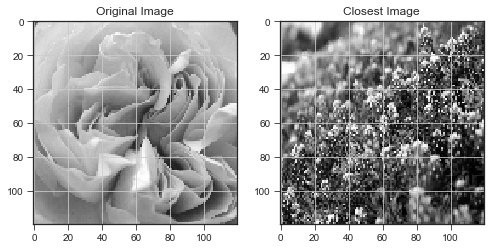

In [118]:
import copy
# find closest image to current image
idx1 = 12
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()
plt.show()

In [119]:
from ipywidgets import fixed
# put it together inside a nice widget
def closest_image(dmat,idx1):
    distances = copy.deepcopy(dmat[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances[idx2] = np.infty
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Original Image:" + target[idx1])
    plt.grid()

    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("Closest Image:"+ target[idx2])
    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("Next Closest Image:"+ target[idx3])
    plt.grid()
    plt.show()
widgets.interact(closest_image,idx1=(0,n_samples-1,1),dmat=fixed(dist_matrix),__manual=True)

A Jupyter Widget

<function __main__.closest_image>

### Gabor Filter



In [120]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

# prepare filter bank kernels
kernels = []
for theta in range(4):
    theta = theta / 4. * np.pi
    for sigma in (1, 3):
        for frequency in (0.05, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

            
# compute the filter bank and take statistics of image
def compute_gabor(row, kernels, shape):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(shape), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt
        
    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X))

gabr_feature = compute_gabor(X[idx_to_reconstruct], kernels, (h,w))
gabr_feature

array([  4.51206762e-01,   1.52554224e-02,  -8.86624669e-03,
        -1.01962068e+00,   1.37936344e-01,   1.67006982e-03,
         1.87014720e-01,  -7.49334667e-01,   3.04369554e-01,
         5.41764718e-03,  -1.26302468e-01,  -1.11136419e+00,
         4.54006484e-04,   2.17468907e-05,   3.37126996e-02,
         9.24902763e+00,   4.51210765e-01,   1.52899022e-02,
        -7.52276330e-03,  -1.01655897e+00,   1.38129591e-01,
         1.80255496e-03,   2.45745729e-01,  -4.66930359e-01,
         3.07005395e-01,   5.71848710e-03,  -1.47585317e-01,
        -1.07771646e+00,   7.31236017e-05,   2.64345056e-05,
         4.32961624e-02,   1.23807650e+01,   4.51206762e-01,
         1.52774002e-02,  -1.06009328e-02,  -1.02027380e+00,
         1.37936344e-01,   1.76630061e-03,   1.26545617e-01,
        -5.69760727e-01,   3.04369554e-01,   5.61157205e-03,
        -1.96879776e-01,  -1.06205945e+00,   4.54006484e-04,
         3.58998220e-05,   2.82088633e-02,   1.23330503e+01,
         4.51210765e-01,

In [121]:
# takes ~3 minutes to run entire dataset
%time gabor_stats = np.apply_along_axis(compute_gabor, 1, X, kernels, (h,w))
print(gabor_stats.shape)

CPU times: user 53.3 s, sys: 285 ms, total: 53.6 s
Wall time: 54.1 s
(1000, 64)


In [122]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix_gabor = pairwise_distances(gabor_stats)

CPU times: user 14.3 ms, sys: 4.4 ms, total: 18.7 ms
Wall time: 14.8 ms


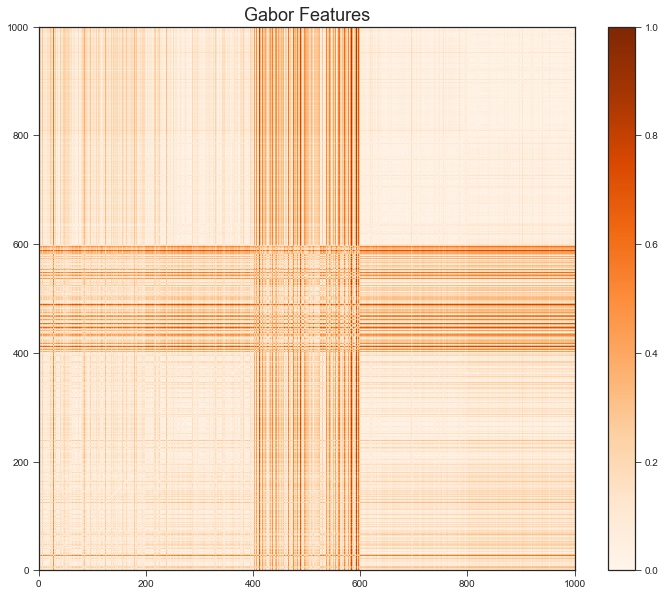

In [123]:
dist_matrix_gabor_norm = dist_matrix_gabor/dist_matrix_gabor.max()
# Plot heat map

# sns.set_palette(['#1f77b4','#EB89B5'])
sns.set_style('ticks')
plt.figure(figsize=(12,10))
plt.pcolormesh(dist_matrix_gabor_norm,cmap='Oranges')
plt.title('Gabor Features',fontsize=18,y=1.)
plt.colorbar()
plt.show()

For Gabor Features, the uniquness of 'Tulip' class is spelled out even more. 

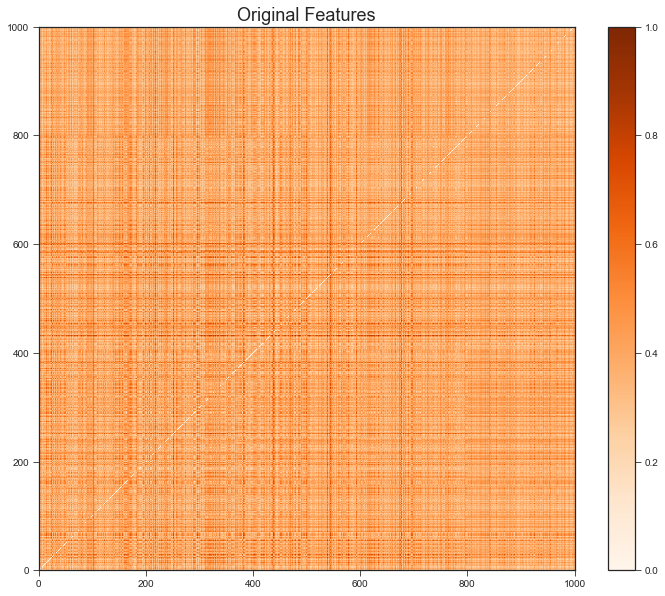

In [124]:
dist_matrix_ori = pairwise_distances(X)
dist_matrix_ori_norm = dist_matrix_ori/dist_matrix_ori.max()
# Plot heat map

sns.set_style('ticks')
plt.figure(figsize=(12,10))
plt.pcolormesh(dist_matrix_ori_norm,cmap='Oranges')
plt.title('Original Features',fontsize=18,y=1.)
plt.colorbar()
plt.show()

Without feature extraction, we can barely observe any patterns from original images. 

In [126]:
widgets.interact(closest_image,idx1=(0,n_samples-1,1),dmat=fixed(dist_matrix_gabor),__manual=True)
plt.show()

A Jupyter Widget

#### 3.3.3 Extraction Method Benchmark

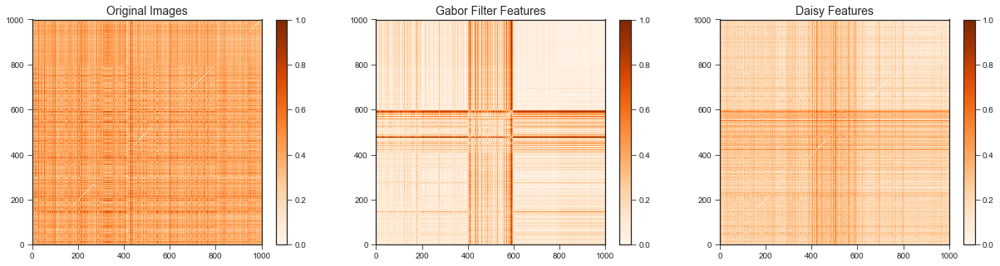

In [125]:
# putting all three heat maps side-by-side for better comparison

sns.set_style('ticks')
plt.figure(figsize=(21,5))

plt.subplot(1,3,1)
plt.pcolormesh(dist_matrix_ori_norm,cmap='Oranges')
plt.title('Original Images',fontsize=14,y=1.)
plt.colorbar()

plt.subplot(1,3,2)
plt.pcolormesh(dist_matrix_gabor_norm,cmap='Oranges')
plt.title('Gabor Filter Features',fontsize=14,y=1.)
plt.colorbar()

plt.subplot(1,3,3)
plt.pcolormesh(dist_matrix_norm,cmap='Oranges')
plt.title('Daisy Features',fontsize=14,y=1.)
plt.colorbar()

plt.show()

In [127]:
matches = 0
for x in range(0, len(X)):
    distances = copy.deepcopy(dist_matrix_gabor[x,:]) # get all image diatances
    distances[x] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    #print(target[x] , " " , target[idx2])
    if target[x] == target[idx2]:
        matches = matches + 1
        
percent = matches / len(X)
print("Accuracy Percent for Gabor:",percent*100)

Accuracy Percent for Gabor: 54.800000000000004


##
We have performed both Daisy Operator and Gabor filter on our images for feature extraction.

While visualising the outputs from both the feature extractiuon methods,Gabor Filters give more accurate images compared to Daisy operator.For supporting our feature extraction method for being promising for prediction task,we have visualized the differences between statistics of extracted features in each target class. Using this we can analyze that we could reach ~52% accuracy with Daisy Operator by increasing the radius to 30 for getting the best accuracy in our image set whereas we could reach ~55% accuracy with Gabor Filter. Hence based on these statistics of extracted features, we can conclude that Gabor Filters works better and gives more accurate results for feature extraction of our image set.
 

From the heat maps above, we can see intuitively that out of the three, Gabor Filter seems to be the most efficient way in distinguish between classes. This also support the statement above. 

## 4. TODO

HOG (histogram of ordered gradients) or LBP (local binary pattern) as another feature extraction method

## 5. Reference